# 11762 Content-Based Image Retrieval
## Master's Degree in Intelligent Systems
### University of the Balearic Islands

---


In [3]:
!pip install jpy

In [4]:
# Setup code for this assignment
import cv2
import math
import numpy as np
import os
import skimage.feature as skfeat
import zipfile

## Adding parent folder to find other libs
import sys
if ".." not in sys.path:
    sys.path.insert(0,"..")
    
import iric_utils.eval_holidays as ev

# Configuring Matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

## Introduction
In this assignment, you will first learn the tools that we will used during the labs. Then, you will implement and evaluate some image description methods to develop a simple CBIR system.

### Tools
Several tools and libraries will be used throughout the semester, like:

*   [Python 3](https://docs.python.org/3/tutorial/)
*   [Numpy](https://docs.scipy.org/doc/numpy/user/quickstart.html)
*   [OpenCV](https://docs.opencv.org/master/d6/d00/tutorial_py_root.html)

It is important to be familiar with them. If that is not the case, please, follow the links above and have a look at the tutorials. There are some quickstart guides available on the course website on [Aula Digital](https://uibdigital.uib.es/).

### The INRIA Holidays dataset
During this course, we will mainly use the [INRIA Holidays](http://lear.inrialpes.fr/people/jegou/data.php) dataset. This dataset is a set of images which contains some personal holidays photos of the authors. The remaining ones were taken on purpose to test the robustness to various image transformations: rotations, viewpoint and illumination changes, blurring, etc. The dataset includes a very large variety of scene types (natural, man-made, water, fire effects, etc) and images are in high resolution. The dataset contains 500 image groups, each of which represents a distinct scene or object. 

For evaluation purposes, the first image of each group is used as the query image and the correct retrieval results are the other images of the group. For instance, the image named *100900.jpg* will be used as query while the corresponding relevant images for this query are images *100901.jpg* and *100902.jpg*, which belongs to the same group.

There are **1491 images in total**, from which **500** are **queries** (one for each group) and the remaining **991** are their corresponding **relevant images**.

### The INRIA Holidays Mini dataset
For development purposes, a small version of the INRIA Holidays dataset is provided for this course. In this reduced version of the dataset, there are **50 images in total**, from which **19** are **queries** and the remaining **31** are their corresponding **relevant images**.

> **Both datasets must be downloaded from [Aula Digital](https://uibdigital.uib.es/) and unzipped into the root directory of the development kit**.

### Performance evaluation
You are provided with a script to evaluate a CBIR system on these datasets. The performance is measured in terms of **mean average precision** (mAP), averaged over all queries (500 or 19, depending on the version of the dataset used). **This script is included in the development kit**.

This library provides two ways of calculating the mAP for a given set of results:
* Using the function `compute_mAP_from_file()`, which receives as parameters:
    * A resulting file following the original format provided by the authors (see [this link](http://lear.inrialpes.fr/people/jegou/data.php))
    * The ground truth filename
  
We provide a perfect results file for each version of the dataset computed from the ground truth as an example:

In [5]:
# Computing mAPs using ground truths
m_ap = ev.compute_mAP_from_file('../holidays/perfect_result.dat', '../holidays/holidays_images.dat')
print('mAP: %.5f' % m_ap)

m_ap = ev.compute_mAP_from_file('../holidays_mini/perfect_result_mini.dat', '../holidays_mini/holidays_images.dat')
print('mAP: %.5f' % m_ap)

mAP: 1.00000
mAP: 1.00000


* Using the function `compute_mAP()`, which receives:
    * The query results as a dictionary (see cell below)
    * The ground truth filename
  
You should use this version if you don't want to save your results into a temporary file. This dictionary should contain, for each query image, an ordered list of the retrieved images. For example:

In [6]:
# Reading the ground truth file to create a perfect results dictionary
res = {}
with open('../holidays_mini/holidays_images.dat') as f:
    for line in f:
        imname = line.strip()
        imno = int(imname[:-len(".jpg")])
    
        # Checking if this is a query image
        if imno % 100 == 0:
            results = []
            res[imname] = results
        else:
            results.append(imname)
print(res)

{'100000.jpg': ['100001.jpg', '100002.jpg'], '100100.jpg': ['100101.jpg'], '100200.jpg': ['100201.jpg'], '100300.jpg': ['100301.jpg', '100302.jpg'], '100400.jpg': ['100401.jpg'], '100500.jpg': ['100501.jpg', '100502.jpg', '100503.jpg'], '100600.jpg': ['100601.jpg'], '100700.jpg': ['100701.jpg'], '100800.jpg': ['100801.jpg'], '100900.jpg': ['100901.jpg', '100902.jpg'], '101000.jpg': ['101001.jpg'], '101100.jpg': ['101101.jpg'], '101200.jpg': ['101201.jpg'], '101300.jpg': ['101301.jpg'], '101400.jpg': ['101401.jpg', '101402.jpg', '101403.jpg', '101404.jpg'], '101500.jpg': ['101501.jpg', '101502.jpg', '101503.jpg', '101504.jpg'], '101600.jpg': ['101601.jpg'], '101700.jpg': ['101701.jpg', '101702.jpg'], '101800.jpg': ['101801.jpg']}


Then you can use this dictionary and the corresponding function to validate a CBIR system:

In [7]:
m_ap = ev.compute_mAP(res, '../holidays_mini/holidays_images.dat')
print('mAP: %.5f' % m_ap)

mAP: 1.00000


### Loading images

For managing images, we will create four lists:
- **`query_names`**: File names of the *query* images
- **`query_imgs`**: *Query* images loaded using OpenCV2
- **`train_names`**: File names of the *train* (database) images
- **`train_imgs`**: *Train* images loaded using OpenCV2

In [8]:
# Separating the dataset into query and train images
query_names = []
query_imgs = []
train_names = []
train_imgs = []

with open('../holidays_mini/holidays_images.dat') as f:
    for line in f:
        imname = line.strip()
        imno = int(imname[:-len(".jpg")])
        img = cv2.imread('../holidays_mini/images/' + imname)
        # Resize the images for a faster operation in this assignment
        img = cv2.resize(img, None, fx=0.25, fy=0.25, interpolation = cv2.INTER_CUBIC)
    
        # Checking if this is a query image
        if imno % 100 == 0:
            query_names.append(imname)
            query_imgs.append(img)
        else:
            train_names.append(imname)
            train_imgs.append(img)

print(len(query_imgs))
print(len(train_imgs))

19
31


In [9]:
img_dict = {}

# Iterate over the training image names and add them to the dictionary
for i, name in enumerate(train_names):
    img_dict[name] = train_imgs[i]
    
# Iterate over the query image names and add them to the dictionary
for i, name in enumerate(query_names):
    img_dict[name] = query_imgs[i]

### Visualizing results
Additionally, you are also provided with a class called `ResultViz`, which includes two functions (`show_results` and `show_one_result`) to show graphically the retrieved results for a specific query. Here are some examples of how to use this class:

In [10]:
# Create the visualization object
rv = ev.ResultViz(query_names, query_imgs, train_names, train_imgs)

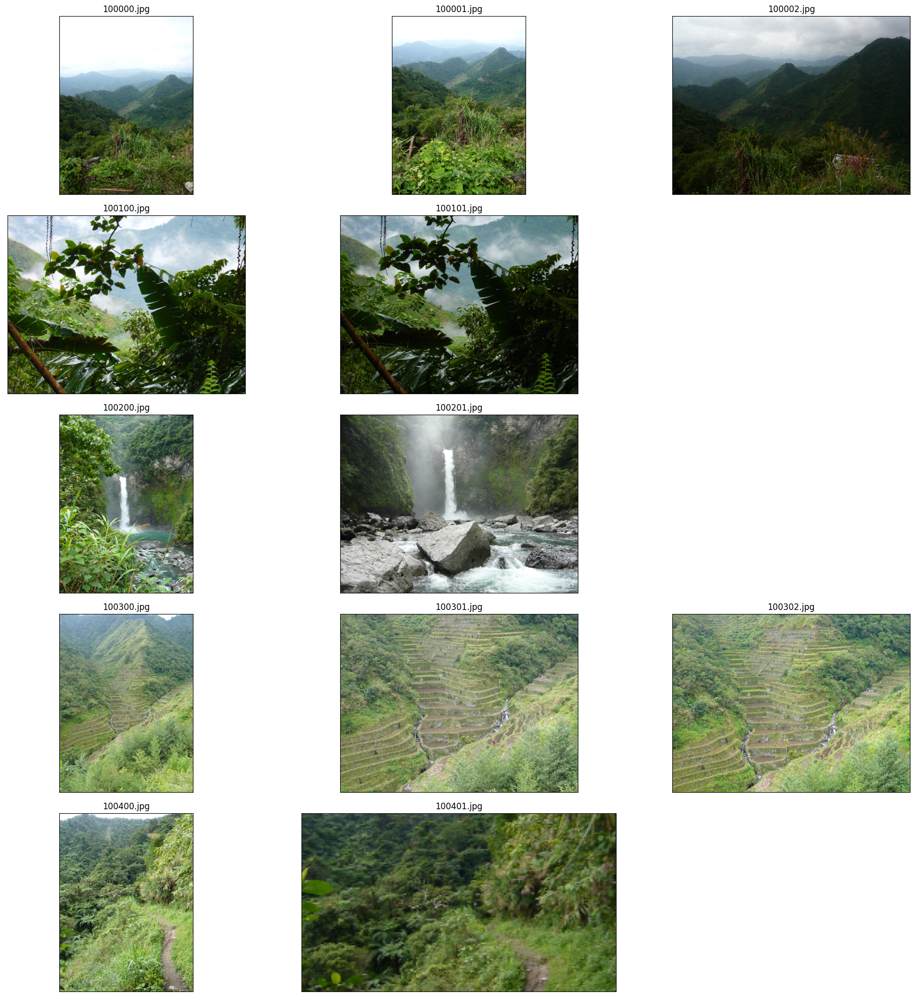

In [11]:
# Show the best 2 retrieved images for the first 5 queries
rv.show_results(res, nqueries = 5, ntrains = 2)

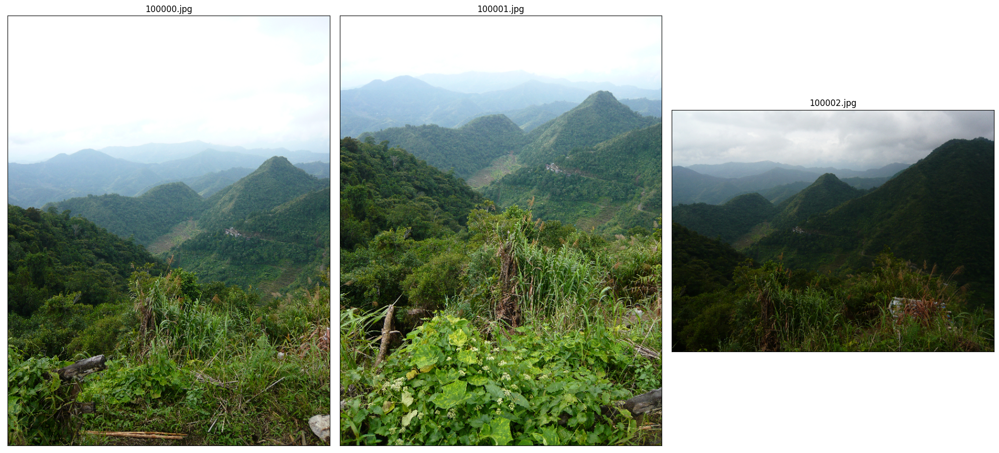

In [12]:
# Show the best 2 retrieved images for the query image '100000.jpg'
rv.show_one_result(res, '100000.jpg', ntrains = 2)

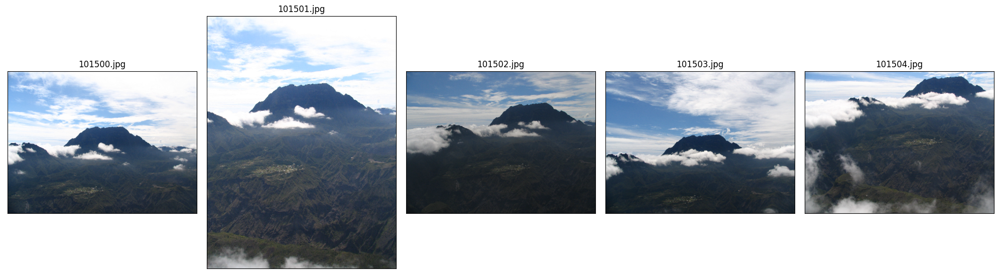

In [13]:
# Show the best 4 retrieved images for the query image '101500.jpg'
rv.show_one_result(res, '101500.jpg', ntrains = 4)

## Global descriptors
Once we have our development environment ready, it is time to start coding the assignment. At this section, we will use and evaluate some global descriptors to develop a simple image retrieval system.

### General framework
First, we will develop some utilities to simplify our work. Write a [Python class](https://docs.python.org/3/tutorial/classes.html) called `CBIR` that will encapsulate the main functionalities of a CBIR system, using the provided descriptions for each method. Assume that there exists a function that can compute a global descriptor of a given image called `desc_func`, which will be implemented later in the assignment:

In [14]:
class CBIR:
    """
    Class to encapsulate the basic functionalities of a CBIR system.
    """
    
    def __init__(self, desc_func, **kwargs):
        """
        Class constructor.
        
        - desc_func: The function to be used for describing the images
        - kwargs: A variable number of parameters required to call desc_func
        """
        self.desc_func = desc_func
        self.kwargs = kwargs
        
    def build_db(self, train_names, train_imgs):
        """
        Create the CBIR system database.
        
        - train_names: An ordered list of the names of the train images
        - train_imgs:  An ordered list of train images (Numpy arrays)
        
        This function should describe each image using desc_func and save the 
        resulting descriptors in a list of numpy arrays called train_descs.
        You should also save the names of each image in an attribute called
        train_names to associate each train image to its corresponding name.
        """
      
        self.train_names = []
        self.train_descs = []
        
        # YOUR CODE HERE
        for name, img in zip(train_names, train_imgs):
            descriptor = self.desc_func(img, **self.kwargs)
            self.train_descs.append(descriptor)
            self.train_names.append(name)
            
    def search_image(self, query_img):
        """
        Search an image in the system.
        
        - query_img: Query image (Numpy array)
        
        RETURNS:
        - An ordered list of tuples, each one with the format (L2 distance, train image name)
        
        This function should describe the query image using desc_func. Next, the resulting
        descriptor should be used to generate a list where each element is a tuple 
        (L2 distance, train image name), ordered according to the L2 distance between 
        the query descriptor and each corresponding train descriptor.
        """       

        # YOUR CODE HERE
        query_desc = self.desc_func(query_img, **self.kwargs)
        distances = []
        
        for i, train_desc in enumerate(self.train_descs):
            distance = np.linalg.norm(query_desc - train_desc)
            distances.append((distance, self.train_names[i]))
        
        distances.sort(key=lambda x: x[0])
        
        return distances
    
    def compute_mAP(self, query_names, query_imgs, gt_file):
        """
        Compute the mAP of a list of query images against the database.
        
        - query_names: An ordered list with the names of query images
        - query_imgs: An ordered list of query images (Numpy arrays)
        - gt_file = Ground truth file. Typically, 'holidays_images.dat'.
        
        RETURN: 
        - total_results: A dictionary containing, for each query image, an ordered list 
            of the retrieved images.
        - m_ap: Mean Average Precision averaged over all queries.
        
        This function should use the other search_image to compute the mAP of a set 
        of queries against the database. You should return the final resulting 
        dictionary, formatted as explained previously, and the computed mAP.
        """

        total_results = {}
        m_ap = 0.0
        
        # YOUR CODE HERE
        
        gt_dict = {}
        with open(gt_file, 'r') as f:
            for line in f:
                line = line.strip().split()
                query_img = line[0]
                gt_imgs = line[1:]

                # Extract only the JPG file names
                jpg_files = [img for img in gt_imgs if img.endswith('.jpg')]

                # Create dictionary with the first value as key and JPG files as values
                gt_dict[query_img] = jpg_files
        
        for i, query_img in enumerate(query_imgs):
            # Search the query image and get the ranked list of retrieved images
            ranked_list = self.search_image(query_img)

            # Compute the AP for this query
            ap = 0.0
            correct = 0
            for j, result in enumerate(ranked_list):
                if result[1] in gt_dict[query_names[i]]:
                    correct += 1
                    ap += float(correct) / (j + 1)

            ap /= len(gt_dict[query_names[i]])
            m_ap += ap

            # Add the ranked list to the total results dictionary
            total_results[query_names[i]] = [r[1] for r in ranked_list]

        m_ap /= len(query_imgs)

        return total_results, m_ap

In [15]:
#Saving gt_dict for later validation purposes
gt_dict = {}
gt_file = '../holidays_mini/perfect_result_mini.dat'

with open(gt_file, 'r') as f:
    for line in f:
        line = line.strip().split()
        query_img = line[0]
        gt_imgs = line[1:]

        # Extract only the JPG file names
        jpg_files = [img for img in gt_imgs if img.endswith('.jpg')]

        # Create dictionary with the first value as key and JPG files as values
        gt_dict[query_img] = jpg_files


### Color histograms
Let's start with histograms. Write a function for computing a descriptor based on 1D color histograms called `compute_1d_color_hist`. The final descriptor of the image will be the concatenation of the **normalized** color histograms of the three individual channels (B, G and R):

> **Useful functions**: [cv2.calcHist](https://docs.opencv.org/4.2.0/d6/dc7/group__imgproc__hist.html), [np.histogram](https://docs.scipy.org/doc/numpy/reference/generated/numpy.histogram.html)

In [16]:
def compute_1d_color_hist(img, bins_per_hist = 32):
    """
    Compute a 1d color histogram of the image.
  
    - img: Color image (Numpy array)
    - bins_per_hist: Number of bins per histogram

    RETURN: 
    - A numpy array of shape (bins_per_hist * 3,)
    """
    # YOUR CODE HERE
    
    # Split the image into its three channels
    b = img[:,:,0]
    g = img[:,:,1]
    r = img[:,:,2]

    # Calculate the histogram for each channel
    b_hist = cv2.calcHist([b], [0], None, [bins_per_hist], [0, 256])
    g_hist = cv2.calcHist([g], [0], None, [bins_per_hist], [0, 256])
    r_hist = cv2.calcHist([r], [0], None, [bins_per_hist], [0, 256])

    # Concatenate and normalize the histograms
    hist = np.concatenate([b_hist, g_hist, r_hist]).flatten()
    hist = cv2.normalize(hist, hist)

    return hist

In [17]:
# Bins: 32
h = compute_1d_color_hist(train_imgs[0], 32);
assert h.shape == (96, )

In [18]:
# Bins: 16
h = compute_1d_color_hist(train_imgs[0], 16);
assert h.shape == (48, )

In [19]:
# Bins: 8
h = compute_1d_color_hist(train_imgs[0], 8);
assert h.shape == (24, )

**Q1**: Using this function and the `CBIR` class you wrote before, in the following cell compute the resulting **mAP** of the system **using 32 bins per histogram**:

In [20]:
# Fill this variable with the resulting mAP
mAP_hist_1d = 0.0

# YOUR CODE HERE

# Create a CBIR object with the compute_1d_color_hist function and 32 bins per histogram
cbir = CBIR(compute_1d_color_hist, bins_per_hist=32)

# Build the CBIR database using the train images
cbir.build_db(train_names, train_imgs)

# Compute the mAP of the system using the test images and ground truth file
total_results, mAP_hist_1d = cbir.compute_mAP(query_names, query_imgs, '../holidays_mini/perfect_result_mini.dat')


In [21]:
print('mAP: %.5f' % mAP_hist_1d)

mAP: 0.76907


Testing one of the value and its top matches

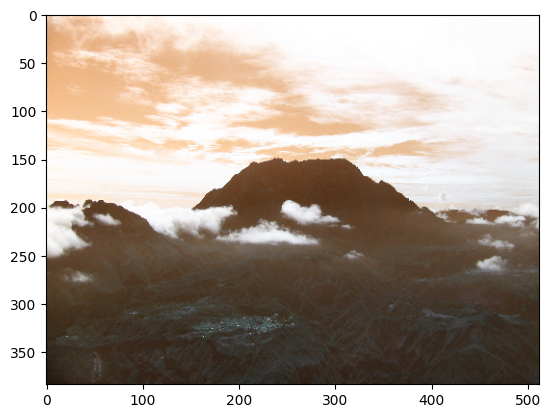

In [22]:
key = '101500.jpg'
plt.imshow(img_dict[key])
plt.show()

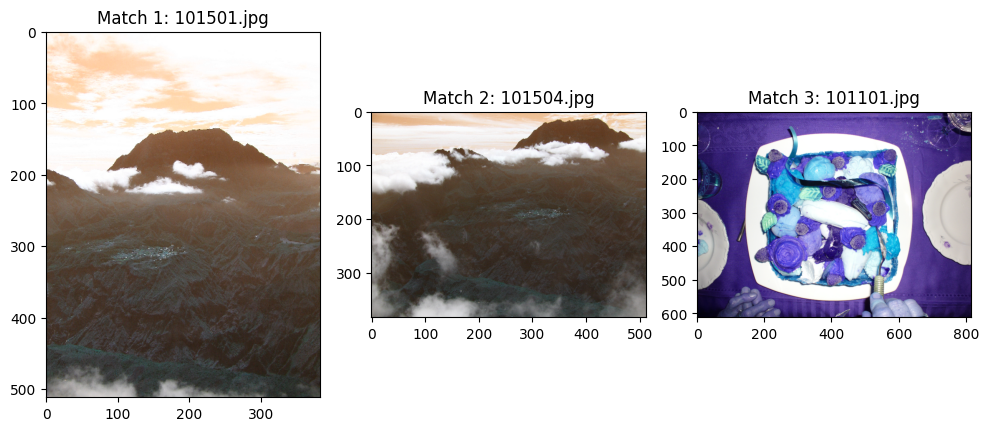

In [23]:
# Plot the top 3 matches for a query image
top_matches = total_results[key][:3]

# Create a figure with 2 rows and 3 columns
fig, axs = plt.subplots(1, 3, figsize=(10, 6))

# Loop through the top matches and plot them in the second row
for i, match in enumerate(top_matches):
    axs[i].imshow(img_dict[match])
    axs[i].set_title('Match {}: {}'.format(i+1, match))

plt.tight_layout()
plt.show()


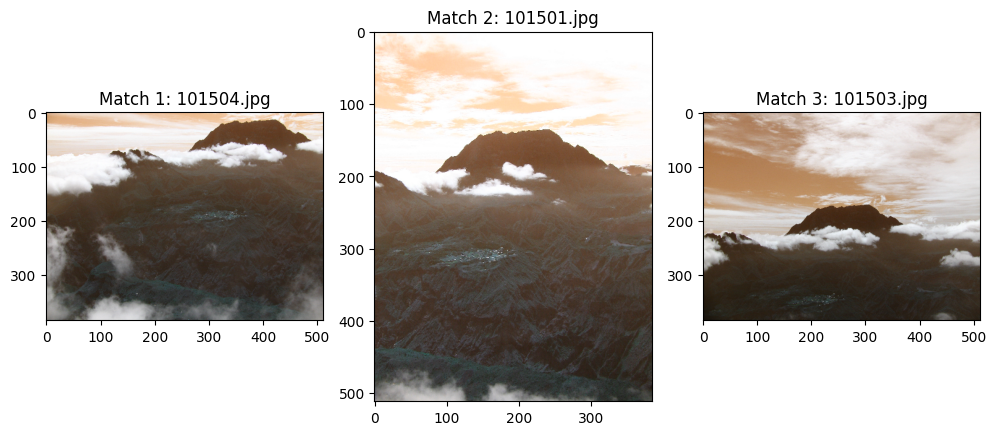

In [24]:
# Plot the actual matches for a query image
real_matches = gt_dict[key][:3]

# Create a figure with 2 rows and 3 columns
fig, axs = plt.subplots(1, 3, figsize=(10, 6))

# Loop through the top matches and plot them in the second row
for i, match in enumerate(real_matches):
    axs[i].imshow(img_dict[match])
    axs[i].set_title('Match {}: {}'.format(i+1, match))

plt.tight_layout()
plt.show()

**Q2**: What is the effect of changing the number of bins per histogram?

Write here the code required to answer the questions stated above. You can add more cells (code / markdown) at this point if you need it.

In [25]:
# Define list of bins per histogram to test
bins_list = [2, 4, 8, 16, 32, 64, 128]

# Compute mAP values for each number of bins
mAP_list = []
for bins in bins_list:
    cbir = CBIR(compute_1d_color_hist, bins_per_hist=bins)
    cbir.build_db(train_names, train_imgs)
    total_results, mAP = cbir.compute_mAP(query_names, query_imgs, '../holidays_mini/perfect_result_mini.dat')
    mAP_list.append(mAP)

# Print the results
for i, bins in enumerate(bins_list):
    print('mAP with %d bins per histogram: %.5f' % (bins, mAP_list[i]))

mAP with 2 bins per histogram: 0.41543
mAP with 4 bins per histogram: 0.69534
mAP with 8 bins per histogram: 0.71507
mAP with 16 bins per histogram: 0.75571
mAP with 32 bins per histogram: 0.76907
mAP with 64 bins per histogram: 0.76632
mAP with 128 bins per histogram: 0.78265


When the number of bins per histogram increases, mean Average Precision increases. Insufficient number of bins with less values, the histogram may not be able to capture enough details and differences in the color distribution

---
Now write a function called `compute_2d_color_hist` for computing a global descriptor of the image using 2D color histograms. The descriptor of the image will be the concatenation of the **normalized** histograms emerging from the three possible combinations of color channels (B/G, B/R and G/R):

In [26]:
def compute_2d_color_hist(img, bins_per_hist = 16):
    """
    Compute a 2d color histogram of the image.
    
    The final descriptor will be the concatenation of 3 normalized 2D histograms: B/G, B/R and G/R.
  
    - img: Color image (Numpy array)
    - bins_per_hist: Number of bins per histogram

    RETURN:
    - A numpy array of shape (bins_per_hist * bins_per_hist * 3,)
    """
    # YOUR CODE HERE
    
    # Split the image into its three color channels
    B, G, R = cv2.split(img)

    # Compute 2D histograms for each combination of color channels
    hist_BG, _, _ = np.histogram2d(B.flatten(), G.flatten(), bins=bins_per_hist)
    hist_BR, _, _ = np.histogram2d(B.flatten(), R.flatten(), bins=bins_per_hist)
    hist_GR, _, _ = np.histogram2d(G.flatten(), R.flatten(), bins=bins_per_hist)

    # Concatenate the histograms and normalize them
    hist_concat = np.concatenate((hist_BG.flatten(), hist_BR.flatten(), hist_GR.flatten()))
    hist_concat /= np.sum(hist_concat)

    return hist_concat

In [27]:
# Bins: 32
h = compute_2d_color_hist(train_imgs[0], 32);
assert h.shape == (3072, )

In [28]:
# Bins: 16
h = compute_2d_color_hist(train_imgs[0], 16);
assert h.shape == (768, )

**Q3**: Using this function and the `CBIR` class you wrote before, in the following cell compute the resulting **mAP** of the system **using 32 bins per histogram**:

In [29]:
# Fill this variable with the resulting mAP
mAP_hist_2d = 0.0

# YOUR CODE HERE

# Create a CBIR object with the compute_2d_color_hist function and 32 bins per histogram
cbir = CBIR(compute_2d_color_hist, bins_per_hist=32)

# Build the CBIR database using the train images
cbir.build_db(train_names, train_imgs)

# Compute the mAP of the system using the test images and ground truth file
total_results, mAP_hist_2d = cbir.compute_mAP(query_names, query_imgs, '../holidays_mini/perfect_result_mini.dat')


In [30]:
print('mAP: %.5f' % mAP_hist_2d)

mAP: 0.67105


**Q4**: What is the effect of changing the number of bins per histogram?

Write here the code required to answer the questions stated above. You can add more cells (code / markdown) at this point if you need it.

In [31]:
# Define list of bins per histogram to test
bins_list = [2, 4, 8, 16, 32, 64, 128]

# Compute mAP values for each number of bins
mAP_list = []
for bins in bins_list:
    cbir = CBIR(compute_2d_color_hist, bins_per_hist=bins)
    cbir.build_db(train_names, train_imgs)
    total_results, mAP = cbir.compute_mAP(query_names, query_imgs, '../holidays_mini/perfect_result_mini.dat')
    mAP_list.append(mAP)

# Print the results
for i, bins in enumerate(bins_list):
    print('mAP with %d bins per histogram: %.5f' % (bins, mAP_list[i]))

mAP with 2 bins per histogram: 0.47907
mAP with 4 bins per histogram: 0.72778
mAP with 8 bins per histogram: 0.75380
mAP with 16 bins per histogram: 0.74255
mAP with 32 bins per histogram: 0.67105
mAP with 64 bins per histogram: 0.65160
mAP with 128 bins per histogram: 0.59500


The decrease in mAP as the number of bins per histogram increases is unexpected, as typically increasing the number of bins per histogram improves the quality of the descriptor, since holidays mini dataset is small, there might be overfitting.

### Local Binary Patterns (LBP)

Let's try LBP. Implement a function called `compute_lbp_descriptor` to calculate an image descriptor based on LBP's. The descriptor of the image should use the _rotation invariant_ and _uniform_ (_riu_) version of the algorithm. The final image descriptor will be the **normalized** histogram of the resulting LBP image:

> **Useful functions**: [skimage.feature.local_binary_pattern](https://scikit-image.org/docs/dev/api/skimage.feature.html?highlight=lbp#skimage.feature.local_binary_pattern)

In [32]:
from skimage.feature import local_binary_pattern

def compute_lbp_descriptor(img, p = 8, r = 1):
    """
    Compute a rotation invariant and uniform LBP histogram as image descriptor.
  
    - img: Input image (Numpy array)
    - p: Neighbors to check in radius r
    - r: Radius in pixels

    RETURN: 
    - A numpy array of shape (p + 2,)
    """    
    # YOUR CODE HERE
    
    # Convert the image to grayscale if it's in color
    if len(img.shape) == 3 and img.shape[-1] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Calculate the LBP image
    lbp = local_binary_pattern(img, p * r, r, method='uniform')

    # Calculate the normalized histogram of LBP codes
    hist, _ = np.histogram(lbp, bins=p + 2, range=(0, p + 2), density=True)
    
    return hist

In [33]:
h = compute_lbp_descriptor(train_imgs[0], 8, 1);
assert h.shape == (10, )

**Q5**: Using this function and the `CBIR` class you wrote before, in the following cell compute the resulting **mAP** of the system **checking 8 neighbors for each pixel at a distance of 1**:

In [34]:
# Fill this variable with the resulting mAP
mAP_lbp = 0.0

# YOUR CODE HERE

# Creating CBIR with the compute_lbp_descriptor function, checking 8 neighbors for each pixel at a distance of 1
cbir = CBIR(compute_lbp_descriptor, p = 8, r = 1)

# Build the CBIR database using the train images
cbir.build_db(train_names, train_imgs)

# Compute the mAP of the system using the test images and ground truth file
total_results, mAP_lbp = cbir.compute_mAP(query_names, query_imgs, '../holidays_mini/perfect_result_mini.dat')


In [35]:
print('mAP: %.5f' % mAP_lbp)

mAP: 0.59915


Testing one of the value and its top matches

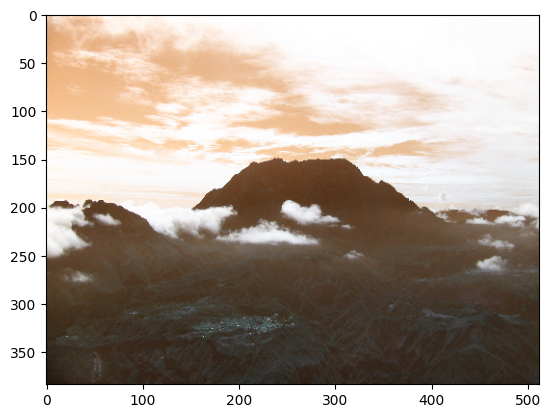

In [36]:
key = '101500.jpg'
plt.imshow(img_dict[key])
plt.show()

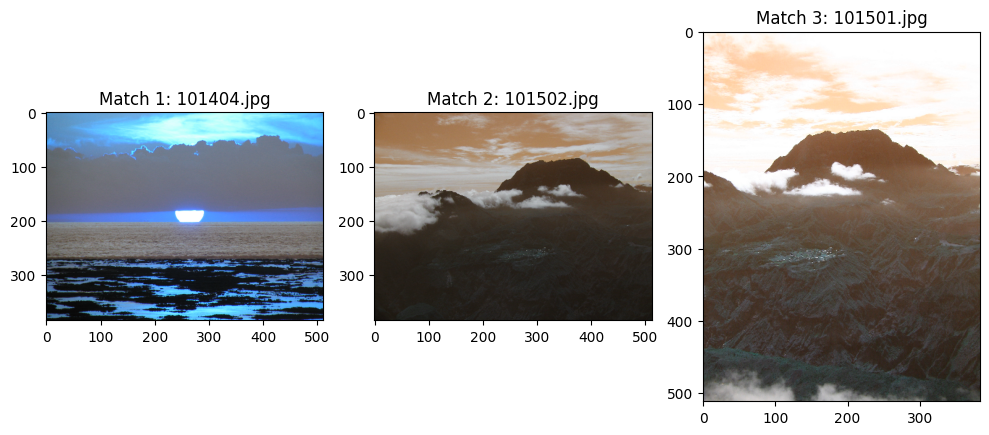

In [37]:
# Plot the top 3 matches for a query image
top_matches = total_results[key][:3]

# Create a figure with 2 rows and 3 columns
fig, axs = plt.subplots(1, 3, figsize=(10, 6))

# Loop through the top matches and plot them in the second row
for i, match in enumerate(top_matches):
    axs[i].imshow(img_dict[match])
    axs[i].set_title('Match {}: {}'.format(i+1, match))

plt.tight_layout()
plt.show()


Since Local Binary Pattern algorithm do not consider the color, it selects blue-toned image as first image because of the cloud's local patterns are similar to the mountain.

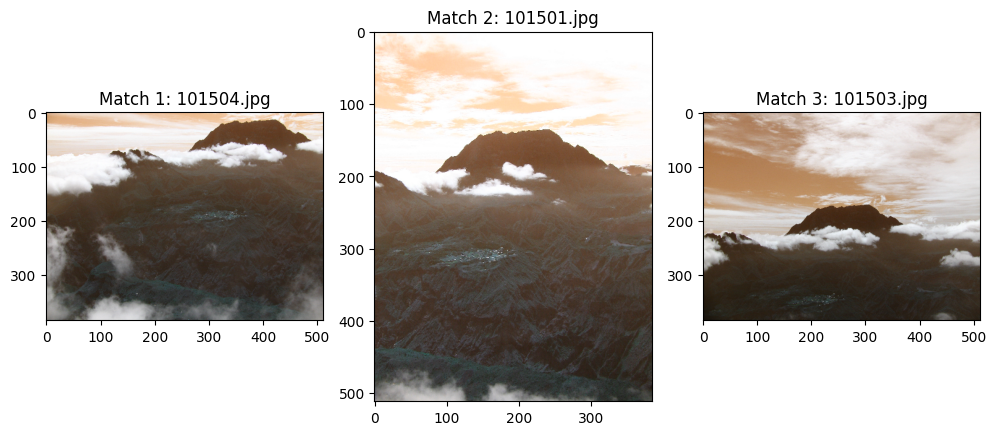

In [38]:
# Plot the actual matches for a query image
real_matches = gt_dict[key][:3]

# Create a figure with 2 rows and 3 columns
fig, axs = plt.subplots(1, 3, figsize=(10, 6))

# Loop through the top matches and plot them in the second row
for i, match in enumerate(real_matches):
    axs[i].imshow(img_dict[match])
    axs[i].set_title('Match {}: {}'.format(i+1, match))

plt.tight_layout()
plt.show()

**Q6**: What is the effect of modifying the number of neighboring pixels $p$ and the radius $r$?

Write here the code required to answer the questions stated above. You can add more cells (code / markdown) at this point if you need it.

In [39]:
# Define p and r values to test
pList = [2, 4, 8, 16]
rList = [1, 2, 3]

# Compute mAP values for each combination of p and r
mAP_list = []
for p in pList:
    for r in rList:
        cbir = CBIR(compute_lbp_descriptor, p=p, r=r)
        cbir.build_db(train_names, train_imgs)
        total_results, mAP = cbir.compute_mAP(query_names, query_imgs, '../holidays_mini/perfect_result_mini.dat')
        mAP_list.append(mAP)

# Print the results
for i, p in enumerate(pList):
    for j, r in enumerate(rList):
        idx = i * len(rList) + j
        print('mAP with p=%d, r=%d: %.5f' % (p, r, mAP_list[idx]))

mAP with p=2, r=1: 0.49636
mAP with p=2, r=2: 0.50792
mAP with p=2, r=3: 0.49186
mAP with p=4, r=1: 0.59652
mAP with p=4, r=2: 0.56811
mAP with p=4, r=3: 0.52390
mAP with p=8, r=1: 0.59915
mAP with p=8, r=2: 0.58517
mAP with p=8, r=3: 0.46759
mAP with p=16, r=1: 0.60474
mAP with p=16, r=2: 0.56367
mAP with p=16, r=3: 0.49683


Looking at the mAP results, we can see that LBP descriptors are not as effective as the color-based histograms we used before. The best result achieved with LBP descriptors is an mAP of 0.60474 with p=16 and r=1, which is significantly lower than the best mAP achieved with the 2D color histogram (0.75380).

However, LBP descriptors have some advantages over color-based descriptors, such as being able to capture texture and pattern information from images. Therefore, they could be useful in certain scenarios, depending on the characteristics of the images being analyzed.

Additionally, it is worth noting that the performance of LBP descriptors can be influenced by the parameters chosen, such as the number of neighbors (p) and the radius (r). We tried different combinations of these parameters and found that some of them, such as p=8 and r=3, led to a significant decrease in performance. Therefore, choosing appropriate parameter values is important for achieving good results with LBP descriptors.

**Q7**: Study the effect of using a grid to describe the image.

Write here the code required to answer the questions stated above. You can add more cells (code / markdown) at this point if you need it.

To study the effect of using a grid to describe the image, we can modify the compute_lbp_descriptor function to extract LBP features from local regions of the image defined by a grid. Specifically, we can divide the image into a number of griids, and compute the LBP feature vector for each cell in the grid. Then, we can concatenate these feature vectors to obtain a final global descriptor.

In [40]:
def compute_lbp_descriptor_grid(img, p=8, r=1, num_grid=4):
    """
    Compute a rotation invariant and uniform LBP histogram as image descriptor.
  
    - img: Input image (Numpy array)
    - p: Neighbors to check in radius r
    - r: Radius in pixels
    - num_grid: Number of grids to divide the image into (along each dimension)

    RETURN: 
    - A numpy array of shape (p + 2,) * num_grid ** 2
    """    
    # YOUR CODE HERE
    
    # Convert the image to grayscale if it's in color
    if len(img.shape) == 3 and img.shape[-1] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Calculate the height and width of each grid
    h, w = img.shape
    grid_h = h // num_grid
    grid_w = w // num_grid

    # Initialize the descriptor array
    desc = np.zeros((num_grid, num_grid, p + 2))

    # Compute LBP histogram for each grid
    for i in range(num_grid):
        for j in range(num_grid):
            # Extract the current grid
            grid = img[i*grid_h : (i+1)*grid_h, j*grid_w : (j+1)*grid_w]

            # Calculate the LBP image for the grid
            lbp = local_binary_pattern(grid, p * r, r, method='uniform')

            # Calculate the normalized histogram of LBP codes
            hist, _ = np.histogram(lbp, bins=p + 2, range=(0, p + 2), density=True)

            # Store the histogram in the descriptor array
            desc[i, j, :] = hist

    # Flatten the descriptor array
    desc = desc.flatten()

    return desc


We can then use this function to compute the image descriptor for each cell with the number of grids as 4, 16 and 64.

In [41]:
# Define list of grid sizes to test
grid_sizes = [4,16,64]

# Compute mAP values for each grid size
mAP_list = []
for g in grid_sizes:
    cbir = CBIR(compute_lbp_descriptor_grid, p=16, r=1, num_grid=g)
    cbir.build_db(train_names, train_imgs)
    total_results, mAP = cbir.compute_mAP(query_names, query_imgs, '../holidays_mini/perfect_result_mini.dat')
    mAP_list.append(mAP)

# Print the results
for i, g in enumerate(grid_sizes):
    print('mAP with number of grid %d: %.5f' % (g, mAP_list[i]))


mAP with number of grid 4: 0.69281
mAP with number of grid 16: 0.62857
mAP with number of grid 64: 0.34659


With a grid size of 4, we achieved the highest mAP score of 0.69281. This suggests that using a smaller number of larger grids results in more discriminative features, allowing for better retrieval performance.

With a grid size of 16, the mAP score decreased to 0.62857, indicating a reduction in the retrieval performance of the system. This could be due to the fact that the feature vectors were less discriminative due to the larger number of smaller grids.

With a grid size of 64, the mAP score dropped significantly to 0.34659. This further supports the idea that using a larger number of smaller grids leads to less discriminative features and poorer retrieval performance.



## Local descriptors
In this section we are going to retrieve images using some of the local descriptors we covered in class.

### Keypoint extraction / description

Let's start by writing a function called `extract_interest_points` to extract a set of keypoints from an image and their corresponding descriptors. The function will receive a parameter called `feat_type` to indicate what method should be used to detect and describe keypoints. This parameter can have one of the following string values:
- `SIFT`: SIFT detector / descriptor
- `FAST_BRIEF`: FAST detector / BRIEF descriptor
- `ORB`: ORB detector / ORB descriptor

> **Useful functions**: [cv2.SIFT_create()](https://docs.opencv.org/4.5.4/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131),  [cv2.FastFeatureDetector_create](https://docs.opencv.org/4.5.4/df/d74/classcv_1_1FastFeatureDetector.html#ab986f2ff8f8778aab1707e2642bc7f8e), [cv2.xfeatures2d.BriefDescriptorExtractor_create](https://docs.opencv.org/4.5.4/d1/d93/classcv_1_1xfeatures2d_1_1BriefDescriptorExtractor.html#ae3bc52666010fb137ab6f0d32de51f60), [cv2.ORB_create](https://docs.opencv.org/4.5.4/db/d95/classcv_1_1ORB.html#aeff0cbe668659b7ca14bb85ff1c4073b)

In [42]:
def extract_interest_points(img, feat_type = 'SIFT', nfeats = 500, thresh = 50):
    """
    Compute keypoints and their corresponding descriptors from an image.
  
    - img: Input image (Numpy array)
    - feat_type: Detection / description method. See cell above
    - nfeats: Maximum number of features. It can be directly used to configure SIFT and ORB.
    - thresh: Detection threshold. Useful for FAST and ORB.
  
    RETURN:
    - kp: A tuple with the detected keypoints (cv2.KeyPoint)
    - des: A numpy array of shape (number_of_kps, descriptor_size) of type:
        - 'np.float32' for SIFT
        - 'np.uint8' for BRIEF and ORB
    """
    
    # YOUR CODE HERE
    if feat_type == 'SIFT':
        detector = cv2.SIFT_create(nfeatures=nfeats)
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif feat_type == 'FAST_BRIEF':
        detector = cv2.FastFeatureDetector_create(threshold=thresh, nonmaxSuppression=True)
        descriptor = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    elif feat_type == 'ORB':
        detector = cv2.ORB_create(nfeatures=nfeats)
        descriptor = cv2.ORB_create(nfeatures=nfeats)

    # Detect keypoints
    kp = detector.detect(img)

    # Compute descriptors
    kp, des = descriptor.compute(img, kp)

    return kp,des

You can check the function showing the resulting keypoints (`cv2.drawKeypoints`):

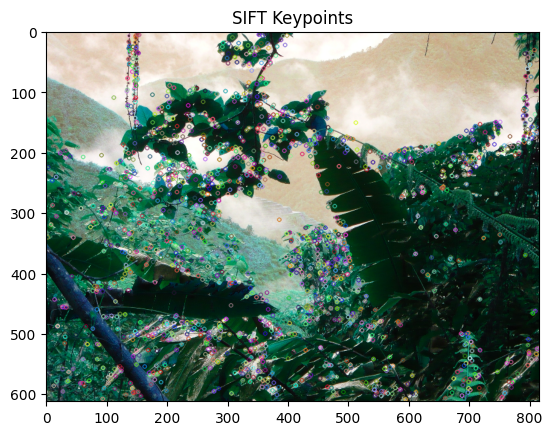

In [147]:
kps, des = extract_interest_points(query_imgs[1], 'SIFT', nfeats=2000, thresh=75)
sift_image = cv2.drawKeypoints(query_imgs[1], kps, None)

plt.imshow(sift_image)
plt.title('SIFT Keypoints')
plt.show()

### Matching images

Next, write a function called `find_matches` to match two set of descriptors. For simplicity, use a brute-force approach for binary descriptors and a FLANN-based approach for floating point descriptors:
> **Useful links**: [cv2.BFMatcher_create](https://docs.opencv.org/4.5.4/d3/da1/classcv_1_1BFMatcher.html#ac6418c6f87e0e12a88979ea57980c020), [cv2.FlannBasedMatcher](https://docs.opencv.org/4.5.4/dc/de2/classcv_1_1FlannBasedMatcher.html#a7b17083dda906384465a32952c1bbe3b), [Feature Matching](https://docs.opencv.org/4.5.4/dc/dc3/tutorial_py_matcher.html)

In [44]:
def find_matches(query_desc, train_desc, k = 2):
    """
    Match two sets of descriptors. For each query descriptor, this method searches
    the k closest descriptors in the train set.
  
    - query_desc: A numpy array of shape (number_of_kps_query, descriptor_size)
    - train_desc: A numpy array of shape (number_of_kps_train, descriptor_size)
    - k: Number of nearest neighbors descriptors to retrieve
  
    RETURN:
    - A tuple where each element is an item of matches, a tuple as well, containing:
        - As first item the best match (cv2.DMatch)
        - As second item, the second best match (cv2.DMatch)
        - And so on, until k
    """
    # YOUR CODE HERE
    if query_desc.dtype == np.uint8:
        # Binary descriptors
        matcher = cv2.BFMatcher_create(normType=cv2.NORM_HAMMING, crossCheck=True)
        matches = matcher.match(query_desc, train_desc)
        matches = sorted(matches, key=lambda x: x.distance)
        return [tuple(matches[i:i+k]) for i in range(0, len(matches), k)]
    else:
        # Floating point descriptors
        index_params = dict(algorithm=0, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(query_desc, train_desc, k=k)
        return matches

### Filtering matches

Write a function called `filter_matches` to filter the resulting matches according to the Nearest Neighbor Distance Ratio (NNDR) criterion:

In [45]:
def filter_matches(matches, ratio = 0.75):
    """
    Given a tuple of matches, apply the NNDR test to filter them.
  
    - matches: A tuple of matches. See 'find_matches' for further info
    - ratio: Ratio to be applied between the best and the second best matches
        for each query
  
    RETURN:
    - A list of filtered matches, where each item is a cv2.DMatch object
      that fullfiled the ratio test condition.
    """
    # YOUR CODE HERE
    filtered_matches = []

    for m, n in matches:
        if m.distance < ratio * n.distance:
            filtered_matches.append(m)

    return filtered_matches

You can check your implementation of these functions using `cv2.drawMatches`:

In [46]:
# Extract keypoints from the query image
kps_q, des_q = extract_interest_points(query_imgs[1], 'SIFT', nfeats=3000, thresh=25)

# Extract keypoints from the train image
kps_t, des_t = extract_interest_points(train_imgs[2], 'SIFT', nfeats=3000, thresh=25)

raw_matches = find_matches(des_q, des_t)
print(len(raw_matches))

3000


514


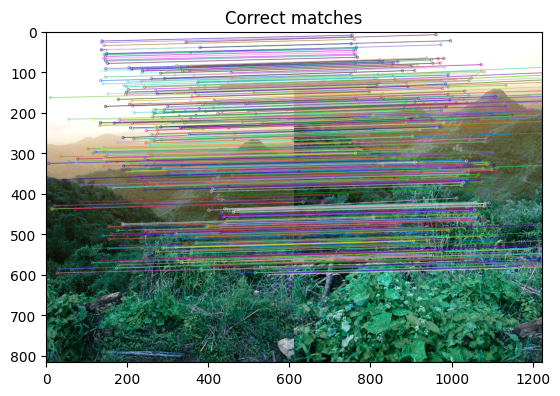

In [47]:
matches = filter_matches(raw_matches, ratio = 0.6)
print(len(matches))
img_matches = cv2.drawMatches(query_imgs[0], kps_q, train_imgs[0], kps_t, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.imshow(img_matches)
plt.title('Correct matches')
plt.show()

### Performance
We can now compare images using local feature descriptors. Given a query image, its closest one in the database will be the image with the **highest number matches after filtering**. Let's reimplement our function `compute_mAP` but using local feature descriptors:

In [145]:
def compute_mAP(query_names, query_imgs, train_names, train_imgs, feat_type='SIFT', nfeats = 500, thresh = 40, ratio = 0.75):
    """
    Perform a search for a list of query images against the database using local 
    feature descriptors. Retrieved images should be sorted according to the 
    total number of matches, in reverse order.
    
    - query_names: An ordered list with the names of the query images
    - query_imgs: An ordered list of query images (Numpy arrays)
    - train_names: An ordered list with the names of the train images
    - train_imgs: An ordered list of train images (Numpy arrays)
    - feat_type: Detection / description method. See above
    - nfeats: Number of features. It can directly be configured for SIFT and ORB
    - thresh: Detection threshold. Useful for FAST and ORB
    - ratio: Ratio to be applied as NNDR
  
    RETURN: 
    - total_results: A dictionary containing, for each query image, an sorted list of the database images
    - m_ap: Mean Average Precision averaged over all queries
    """
    
    total_results = {}
    m_ap = 0.0
    
    # YOUR CODE HERE
    
    # Define feature detector and descriptor extractor
    if feat_type == 'SIFT':
        detector = cv2.xfeatures2d.SIFT_create(nfeatures=nfeats)
        extractor = cv2.xfeatures2d.SIFT_create(nfeatures=nfeats)
    elif feat_type == 'ORB':
        detector = cv2.ORB_create(nfeatures=nfeats, scoreType=cv2.ORB_FAST_SCORE, nlevels=8, scaleFactor=1.2, fastThreshold=thresh)
        extractor = cv2.ORB_create(nfeatures=nfeats, scoreType=cv2.ORB_FAST_SCORE, nlevels=8, scaleFactor=1.2, fastThreshold=thresh)
    elif feat_type == 'FAST':
        detector = cv2.FastFeatureDetector_create(threshold=thresh)
        extractor = cv2.xfeatures2d.SIFT_create(nfeatures=nfeats)
    else:
        raise ValueError('Invalid feature type')

    # Extract features from train images
    train_feats = {}
    for i, img in enumerate(train_imgs):
        kp, desc = extractor.detectAndCompute(img, None)
        train_feats[train_names[i]] = (kp, desc)
        
    for i, query_img in enumerate(query_imgs):
        # Extract features from query image
        kp, desc = extractor.detectAndCompute(query_img, None)

        # Match query features to train features
        matches = []
        
        if feat_type =='ORB':
            for train_name, (train_kp, train_desc) in train_feats.items():
                matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=False)
                raw_matches = matcher.match(desc, train_desc)

                # Apply nearest neighbor distance ratio filtering
                good_matches = []
                for m in raw_matches:
                    if len(train_kp) >= 2:
                        if m.distance < ratio * raw_matches[1].distance:
                            good_matches.append(m)

                matches.append((train_name, len(good_matches)))
                
        # Use a more advanced matching algorithm: FLANN
        else:
            FLANN_INDEX_KDTREE = 1
            flann_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
            flann = cv2.FlannBasedMatcher(flann_params, {})
            for train_name, (train_kp, train_desc) in train_feats.items():
                matches_flann = flann.knnMatch(desc, train_desc, k=2)
                good_matches = []
                for m, n in matches_flann:
                    if m.distance < ratio * n.distance:
                        good_matches.append(m)

                matches.append((train_name, len(good_matches)))

        # Sort matches by number of matches
        matches = sorted(matches, key=lambda x: x[1], reverse=True)
        # Compute AP and add results to total results dictionary
        ap = 0.0
        correct = 0
        for j, (train_name, _) in enumerate(matches):
            if train_name in gt_dict[query_names[i]]:
                correct += 1
                ap += float(correct) / (j + 1)

        ap /= len(gt_dict[query_names[i]])
        m_ap += ap

        # Add the ranked list to the total results dictionary
        total_results[query_names[i]] = [r[1] for r in matches]

    m_ap /= len(query_imgs)

    
    return total_results, m_ap


In [108]:
results, m_ap = compute_mAP(query_names, query_imgs, train_names, train_imgs)
print(m_ap)

0.8904122193595877


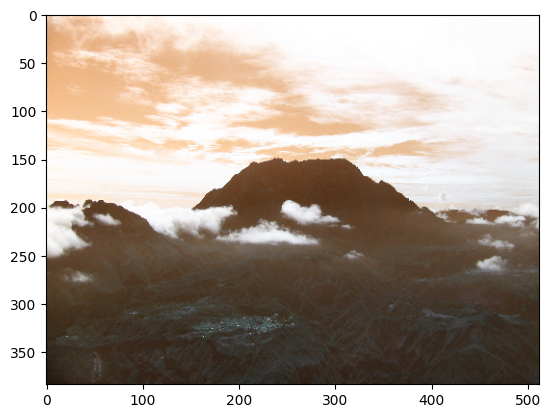

In [109]:
key = '101500.jpg'
plt.imshow(img_dict[key])
plt.show()

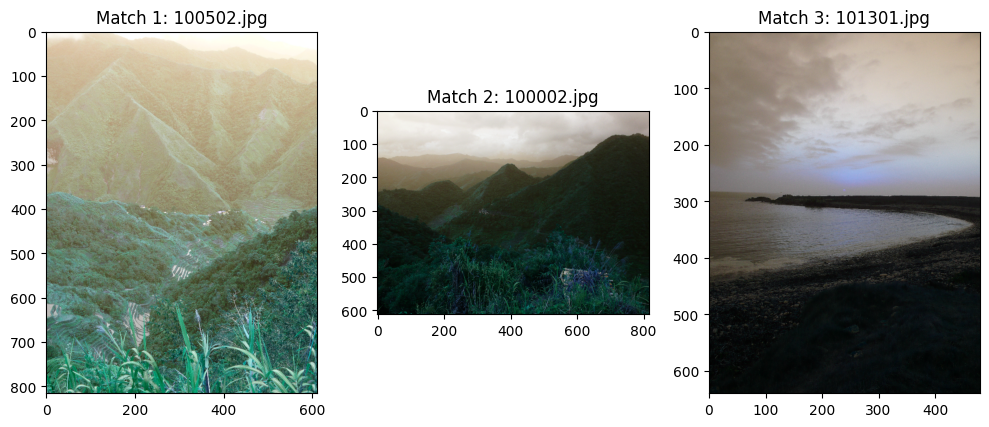

In [110]:
# Plot the top 3 matches for a query image
top_matches = total_results[key][:3]

# Create a figure with 2 rows and 3 columns
fig, axs = plt.subplots(1, 3, figsize=(10, 6))

# Loop through the top matches and plot them in the second row
for i, match in enumerate(top_matches):
    axs[i].imshow(img_dict[match])
    axs[i].set_title('Match {}: {}'.format(i+1, match))

plt.tight_layout()
plt.show()


**Q8**: For each method (SIFT, FAST/BRIEF and ORB), play with its corresponding parameters in order to achieve the best possible performance in terms of mAP.

In [128]:
# Fill these variables with the best resulting mAPs
best_mAP_SIFT = 0.0
best_mAP_FASTBRIEF = 0.0
best_mAP_ORB = 0.0
# YOUR CODE HERE

# SIFT
for nfeats in [200, 500, 1000]:
    for ratio in [0.7, 0.75, 0.8]:
        results, m_ap = compute_mAP(query_names, query_imgs, train_names, train_imgs, feat_type='SIFT', nfeats=nfeats, ratio=ratio)
        best_mAP_SIFT = max(best_mAP_SIFT, m_ap)

# FAST/BRIEF
for thresh in [40, 60, 80]:
    for ratio in [0.7, 0.75, 0.8]:
        results, m_ap = compute_mAP(query_names, query_imgs, train_names, train_imgs, feat_type='FAST', thresh=thresh, ratio=ratio)
        best_mAP_FASTBRIEF = max(best_mAP_FASTBRIEF, m_ap)

# ORB
for nfeats in [100, 200, 500]:
    for thresh in [10, 20, 40, 60]:
        results, m_ap = compute_mAP(query_names, query_imgs, train_names, train_imgs, feat_type='ORB', nfeats=nfeats, thresh=thresh)
        best_mAP_ORB = max(best_mAP_ORB, m_ap)


In [129]:
print('Best mAP (SIFT): %.5f' % best_mAP_SIFT)
print('Best mAP (FAST/BRIEF): %.5f' % best_mAP_FASTBRIEF)
print('Best mAP (ORB): %.5f' % best_mAP_ORB)

Best mAP (SIFT): 0.89677
Best mAP (FAST/BRIEF): 0.86705
Best mAP (ORB): 0.37003


**Q9**: Compare the three different methods in terms of accuracy. Which one is the most accurate method? Which one is the least?

Write here the code required to answer the questions stated above. You can add more cells (code / markdown) at this point if you need it.

we can see that the most accurate method is SIFT with a best mAP of 0.89677. The next most accurate method is FAST/BRIEF with a best mAP of 0.86705. The least accurate method is ORB with a best mAP of only 0.37003.

SIFT and FAST have similar performances. SIFT is designed to be invariant to scale, rotation, and translation, which means it can identify features in an image regardless of their size, orientation, and position. SIFT is a robust algorithm, but it is slow to compute. FAST, on the other hand, is a much faster algorithm that is used for detecting key points in images. It is particularly useful for real-time applications such as video tracking and mobile robotics. In this scenerio, in terms of accuracies, SIFT performed the best.

**Q10**: Compare the three different methods in terms of detection/description speed. Which one is the fastest method? Which one is the slowest?

> **Hints**:
> - [Here](https://jakevdp.github.io/PythonDataScienceHandbook/01.07-timing-and-profiling.html) you can find a useful link about timing in Jupyter Notebooks
> - You can also consider using the `time` module
> - To provide a measure independent of the number of features found in the image, you can compute, for instance, features / ms

Write here the code required to answer the questions stated above. You can add more cells (code / markdown) at this point if you need it.

In [146]:
import timeit

nfeats = 1500
thresh = 40
ratio = 0.75

# Defining the number of iterations for the timing test
num_iter = 3

# Define the function to time
def test_func(feat_type):
    start_time = timeit.default_timer()
    for i in range(num_iter):
        compute_mAP(query_names, query_imgs, train_names, train_imgs, feat_type=feat_type, nfeats=nfeats, thresh=thresh, ratio=ratio)
    end_time = timeit.default_timer()
    elapsed_time = end_time - start_time
    feats_per_ms = (num_iter * nfeats * len(query_imgs)) / (elapsed_time * 1000)
    # UPDATE nfeats with the number of features returned by FAST!
    
    return feats_per_ms, elapsed_time

# Time the SIFT function
feats_per_ms_sift, elapsed_time_sift = test_func('SIFT')

# Time the FAST function
feats_per_ms_fast, elapsed_time_fast = test_func('FAST')

# Time the ORB function
feats_per_ms_orb, elapsed_time_orb = test_func('ORB')

# Print the results
print("SIFT features per ms: ", feats_per_ms_sift)
print("Total execution time for SIFT: ", elapsed_time_sift)
print("FAST features per ms: ", feats_per_ms_fast)
print("Total execution time for FAST: ", elapsed_time_fast)
print("ORB features per ms: ", feats_per_ms_orb)
print("Total execution time for ORB: ", elapsed_time_orb)


SIFT features per ms:  2.3576547721531256
Total execution time for SIFT:  36.26485141500052
FAST features per ms:  2.3886020657127083
Total execution time for FAST:  35.79499541899986
ORB features per ms:  6.913049834807945
Total execution time for ORB:  12.367913155999304


 The higher the number of features per millisecond, the faster the algorithm is at detecting features.

Based on the results, it appears that both SIFT and FAST have similar feature extraction speeds, while ORB is significantly faster in comparison. This could be due to the fact that ORB is a binary feature detector and descriptor, which is designed to be efficient and fast, whereas SIFT and FAST are more computationally intensive algorithms.

ORB is significantly faster, detecting 7.12 features per millisecond. However, its total execution time is much shorter than the other two algorithms, taking only 12 seconds to execute. This suggests that ORB sacrifice accuracy for speed, as it is designed to detect features quickly and efficiently.

Despite having a similar feature per millisecond ratio, it should be noted that FAST does not extract the exact same number of features as SIFT. 

---

&copy; Emilio Garcia-Fidalgo, University of the Balearic Islands